In [1]:
# create env
from simulator.maze_env import MazeEnv
from simulator.box_env import BoxEnv
from configs.str2config import str2config, add_default_argument_and_parse
import argparse
import logging
from utils.config import seed_everything
logging.basicConfig(level = logging.INFO)

/home/rainorangelemon/anaconda3/envs/ravens/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
from configs.str2config import str2config, add_default_argument_and_parse
from utils.config import *
arg_parser = argparse.ArgumentParser(description="Start the experiment agent")
config_setup = add_default_argument_and_parse(arg_parser, 'experiment')
config_setup = process_config(config_setup)

INFO:root:Hi, This is root.
[INFO]: Hi, This is root.
INFO:root:After the configurations are successfully processed and dirs are created.
[INFO]: After the configurations are successfully processed and dirs are created.
INFO:root:The pipeline of the project will begin now.
[INFO]: The pipeline of the project will begin now.


THE Configuration of your experiment ..
{'ID_Env_End': 20,
 'ID_Env_Start': 0,
 'agent': 'Trainer',
 'agent_identifier': True,
 'async_loading': False,
 'batch_size': 4,
 'best_epoch': False,
 'con_train': False,
 'cuda': True,
 'data_loader_workers': 0,
 'data_root': '/home/rainorangelemon/Documents/GNN_MultiAgentSearch/dataset/',
 'dim': 2,
 'dim_embed': 64,
 'dim_te': 64,
 'env_dim': 2,
 'env_name': 'BoxEnv',
 'exp_name': 'AgentExplorerMultiAgentRegion',
 'exp_net': 'chenning',
 'exp_setting': 'AgentExplorerMultiAgentRegion',
 'gpu_device': 0,
 'infer_w': inf,
 'k': 6,
 'lastest_epoch': True,
 'learning_rate': 0.0003,
 'log_interval': 10,
 'log_loss_interval': 40,
 'log_time_trained': '0',
 'log_visual_interval': 200,
 'max_epoch': 200000,
 'max_num_agents': 5,
 'min_max_num_agents': [1, 5],
 'min_num_agents': 1,
 'mode': 'train',
 'momentum': 0.9,
 'n_nodes': 1000,
 'n_workers': 2,
 'negative_sampling': 'just_optimal',
 'num_Cases_PerProblemGraph': 1,
 'num_ProblemGraph_PerEnv': 20

# Maze Environment

In [3]:
config_setup.env_name = "MazeEnv"
env = MazeEnv(config_setup)
env.init_new_problem_graph(index=0)
env.init_new_problem_instance(index=0);

Initializing Maze environment...


In [4]:
# sometimes this takes a while to run (but no more than the time_budget - 60 seconds)
# if the result is None, then it means there is no solution for this problem instance within the time budget
# in that case, run the above cell again to initialize a new problem instance
seed_everything(1234)
from expert.CBS import cbs, CBSPlanner
result = CBSPlanner().plan(env, env.agent_starts_vidxs, env.agent_goals_vidxs, time_budget=60)
assert result is not None, "No solution found for this problem instance"

INFO:utils.config:Global seed set to 1234
[INFO]: Global seed set to 1234


In [5]:
# this will take a while to run (about 1-2 minute)
env.render_paths_animate(result.solution, env.agent_goals_vidxs, 'figures/play_maze.mp4')

INFO:matplotlib.animation:Animation.save using <class 'matplotlib.animation.FFMpegWriter'>
[INFO]: Animation.save using <class 'matplotlib.animation.FFMpegWriter'>
INFO:matplotlib.animation:MovieWriter._run: running command: ffmpeg -f rawvideo -vcodec rawvideo -s 4000x4000 -pix_fmt rgba -r 20 -loglevel error -i pipe: -vcodec h264 -pix_fmt yuv420p -y figures/play_maze.mp4
[INFO]: MovieWriter._run: running command: ffmpeg -f rawvideo -vcodec rawvideo -s 4000x4000 -pix_fmt rgba -r 20 -loglevel error -i pipe: -vcodec h264 -pix_fmt yuv420p -y figures/play_maze.mp4


<video controls src="figures/play_maze.mp4">

# Box Environment

In [6]:
seed_everything(1234)
config_setup.env_name = "BoxEnv"
env = BoxEnv(config_setup)
env.init_new_problem_graph(index=0)
env.init_new_problem_instance(index=0);

INFO:utils.config:Global seed set to 1234
[INFO]: Global seed set to 1234


Initializing Box Environment


In [7]:
# sometimes this takes a while to run (but no more than the time_budget - 60 seconds)
# if the result is None, then it means there is no solution for this problem instance within the time budget
# in that case, run the above cell again to initialize a new problem instance
from expert.CBS import cbs, CBSPlanner
result = CBSPlanner().plan(env, env.agent_starts_vidxs, env.agent_goals_vidxs, time_budget=60)
assert result is not None, "No solution found for this problem instance"

In [9]:
# this will take a while to run (about 1-2 minute)
env.render_paths_animate(result.solution, env.agent_goals_vidxs, 'figures/play_box.gif')

INFO:matplotlib.animation:Animation.save using <class 'matplotlib.animation.PillowWriter'>
[INFO]: Animation.save using <class 'matplotlib.animation.PillowWriter'>



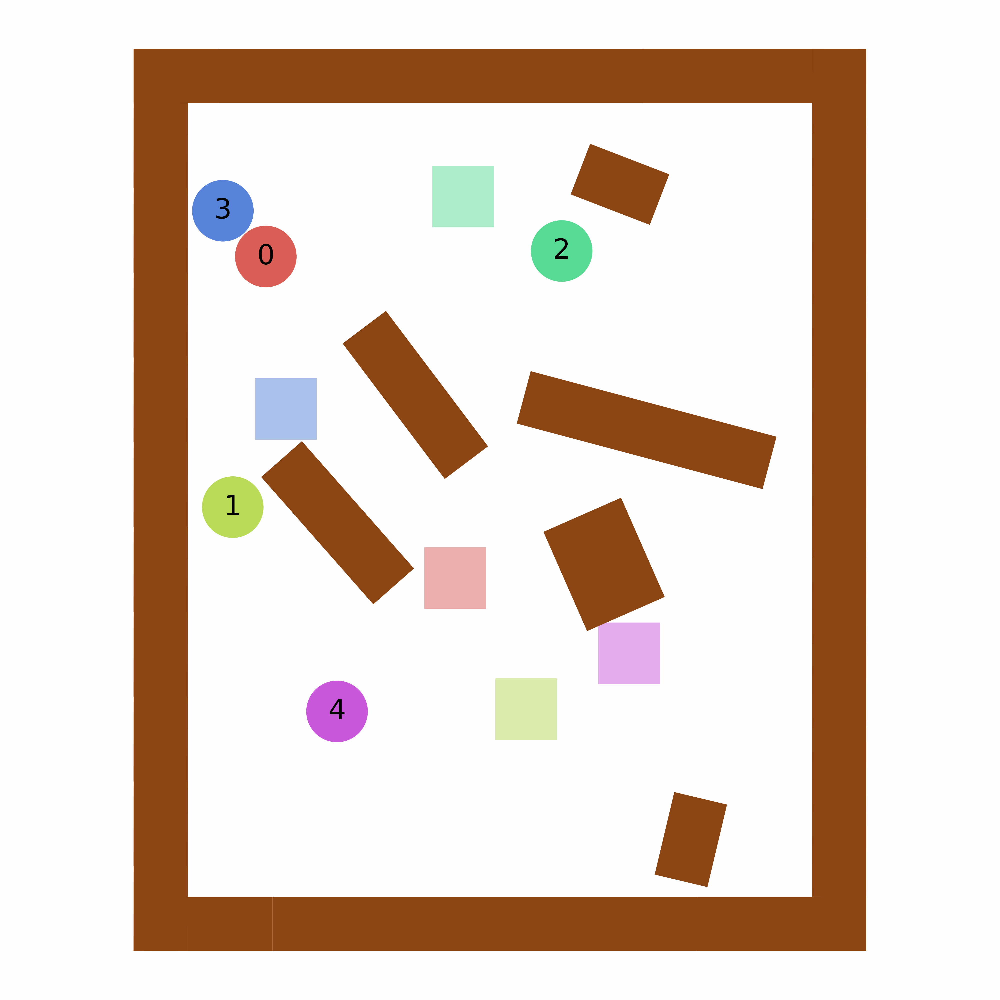

In [11]:
import base64
from IPython.display import HTML
b64 = base64.b64encode(open('figures/play_box.gif','rb').read()).decode('ascii')
display(HTML(f'<img src="data:image/gif;base64,{b64}" />'))